In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc
import numpy as np
import os
from FACS_Sampling.utils import create_adata

sc.set_figure_params(figsize=(8,8), fontsize=15, )

In [5]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')
import warnings
warnings.filterwarnings("ignore")

/home/ekarimi/miniconda3/envs/facs_sampling/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


scanpy==1.9.6 anndata==0.10.3 umap==0.5.5 numpy==1.26.0 scipy==1.11.4 pandas==2.1.1 scikit-learn==1.3.2 statsmodels==0.14.0 igraph==0.11.3 pynndescent==0.5.11


In [2]:

# Get the file path from the environment variable
file_path_env = os.getenv('MY_FACS_DATA_PATH')
input_file1 = os.path.join(file_path_env,'sara_data',"adata_ref_sara_2M.h5ad")
input_file2 = os.path.join(file_path_env,'sara_data', 'reps',"random_adata_2_30__0.h5ad")
input_file3 = os.path.join(file_path_env,'sara_data', 'reps',"fsbs_adata_2_30__0.h5ad")

adata_ref = sc.read_h5ad(input_file1)
adata_random = sc.read_h5ad(input_file2)
adata_fsbs =  sc.read_h5ad(input_file3)


In [3]:
label_key = 'population'

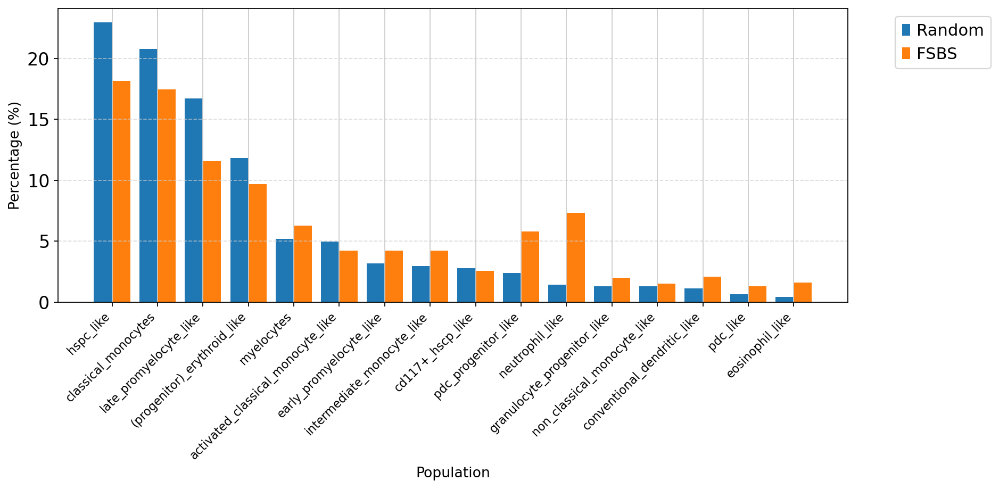

In [4]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import scanpy as sc

def plot_improved_population_distribution(adata_list, labels, adata_ref):
    # Create a DataFrame to hold the count data
    pop_counts = pd.DataFrame({
        label: adata.obs['population'].value_counts(normalize=True) * 100
        for adata, label in zip(adata_list, labels)
    })

    # Sort the populations based on the counts in adata_ref
    ref_order = adata_ref.obs['population'].value_counts().index
    pop_counts = pop_counts.reindex(ref_order)

    # Create the bar plot
    fig, ax = plt.subplots(figsize=(12, 6))
    n = len(pop_counts.columns)
    bar_width = 0.8 / n
    indices = np.arange(len(pop_counts))

    for i, label in enumerate(labels):
        ax.bar(indices + i * bar_width, pop_counts[label], bar_width, label=label)

    # Improve the aesthetics
    ax.set_xlabel('Population', fontsize=12)
    ax.set_ylabel('Percentage (%)', fontsize=12)
    ax.set_xticks(indices + bar_width * (n - 1) / 2)
    ax.set_xticklabels(pop_counts.index, rotation=45, ha='right', fontsize=10)
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.grid(axis='y', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()

# Example usage
plot_improved_population_distribution([adata_random, adata_fsbs], ['Random', 'FSBS'], adata_ref)


In this analysis, we aimed to evaluate the efficacy of feature-space binned sampling (FSBS) compared to random sampling within the context of fluorescence-activated cell sorting (FACS) data comprising a mixture of acute myeloid leukemia (AML) and healthy samples. The bar plot provided herein depicts the percentage distribution of various cell populations as identified by their respective markers in both FSBS and randomly sampled datasets.

Upon examination of the bar plot, it is evident that FSBS has a pronounced impact on the representation of certain cell populations, such as "hspc_like" and "classical_monocytes". These populations show a significantly higher percentage in the FSBS dataset compared to the random sampling approach. This observation suggests that FSBS may enhance the detection and representation of specific populations, which might be underrepresented in a randomly sampled dataset. This is particularly relevant in the context of AML, where the representation of hematopoietic stem and progenitor cells (HSPCs) can be crucial for understanding disease pathology and progression.

Moreover, the populations "early_promyelocyte_like" and "granulocyte_progenitor_like" also demonstrate increased representation in the FSBS dataset. This could be indicative of FSBS's ability to capture transitional stages of cell differentiation, which are often pivotal in studies that aim to elucidate the dysregulation of hematopoiesis in AML.

Conversely, rare cell populations such as "eosinophil_like" and "pdc_like" remain underrepresented in both sampling methods, raising concerns about the sensitivity of both FSBS and random sampling in capturing these populations. Given the role of plasmacytoid dendritic cells (pDCs) in immune response and potential involvement in AML immunopathology, the underrepresentation of "pdc_like" cells could potentially skew our analysis and interpretation of the immune landscape in AML.

The disparity in sampling efficiencies between FSBS and random sampling underscores the necessity to further optimize our sampling methodology. The objective is to ensure a comprehensive representation of cell populations, thereby facilitating a more robust and accurate characterization of the cellular composition within our FACS data. This is particularly important for the identification of novel biomarkers and therapeutic targets in AML.

In conclusion, while FSBS shows promise in enriching for certain populations over random sampling, there remains room for improvement, particularly in the capture of less abundant cell types. Future efforts will be directed towards refining our sampling protocols and possibly integrating additional computational or experimental strategies to ensure that rare populations are adequately represented. This will improve the reliability of our findings and the potential to translate these into clinical applications for AML diagnostics and treatment.

In [5]:
adata_ref.var_names

Index(['cd33_aligned', 'hla_dr_aligned', 'cd19_cd3_aligned', 'cd11b_aligned',
       'cd66b_aligned', 'cd16_aligned', 'cd163_aligned', 'cd14_aligned',
       'cd2_aligned', 'siglec8_aligned', 'cd13_aligned', 'cd45_aligned',
       'cd141_aligned', 'cd15_aligned', 'cd123_aligned', 'cd11c_aligned',
       'cd117_aligned', 'cd45ra_aligned', 'cd34_aligned', 'itgb7_aligned',
       'cd88_cd89_aligned', 'fcer1a_aligned'],
      dtype='object')

In [7]:
adata_ref.obs.head()

,old_index,unique_id,sex,age,subtype,type,blastcount,survival_sorter,run,sample_id,alignment_mc_aligned,flowsom_cluster,flowsom_metacluster,population
0,30168021,20021_9,m,64,"nk,_npm1_wt;_flt3_itd_(<0,5)",pb,90,"69,2",9,20021,10,185,28,late_promyelocyte_like
1,6299979,115_3,m,54,"complex,_del5",bm,30,"36,3",3,115,14,16,1,pdc_progenitor_like
2,18682804,359_6,m,72,"nk,_npm1+_flt3_itd_(<0,5)",pb,no_punction,"56,2",6,359,3,80,17,neutrophil_like
3,18092591,359_6,m,72,"nk,_npm1+_flt3_itd_(<0,5)",pb,no_punction,"56,2",6,359,12,142,24,(progenitor)_erythroid_like
4,6997736,183_3,m,61,trisomy_8,bm,100,"65,6",3,183,13,71,2,hspc_like


In [8]:
adata_ref.obs['subtype'].value_counts().keys()

CategoricalIndex(['nk,_npm1+_flt3_itd_(>0,5)', 'nk,_npm1+',
                  'nk,_npm1_wt;_flt3_itd_(<0,5)', 'nk,_npm1+_flt3_itd_(<0,5)',
                  'inv(16)', 'trisomy_8', 'nk,_npm1_wt,_flt3_wt', 'apl',
                  'complex,_tp53', 'idh2', 'nk,_npm1_wt;_flt3_itd_(>0,5)',
                  't(8;21),_c_kit', 'nk,_cebpa', 'healthy', 'evi1', 'del5',
                  'complex,_del5', 't(8;21)', 'idh1'],
                 categories=['apl', 'complex,_del5', 'complex,_tp53', 'del5', ..., 'nk,_npm1_wt;_flt3_itd_(>0,5)', 't(8;21)', 't(8;21),_c_kit', 'trisomy_8'], ordered=False, dtype='category', name='subtype')

## Clustering tutorial Scanpy

/home/ekarimi/miniconda3/envs/facs_sampling/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


scanpy==1.9.6 anndata==0.10.3 umap==0.5.5 numpy==1.26.0 scipy==1.11.4 pandas==2.1.1 scikit-learn==1.3.2 statsmodels==0.14.0 igraph==0.11.3 pynndescent==0.5.11


normalizing counts per cell
    finished (0:00:00)


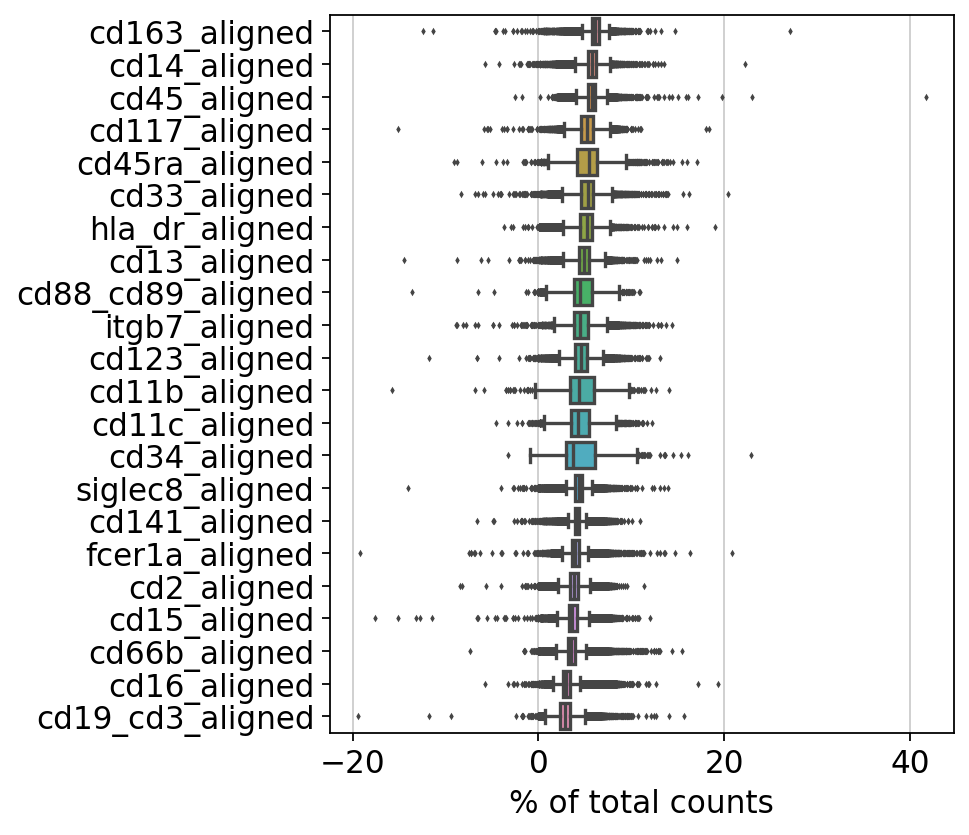

In [5]:
sc.pl.highest_expr_genes(adata_ref, n_top=22, )

normalizing counts per cell
    finished (0:00:00)


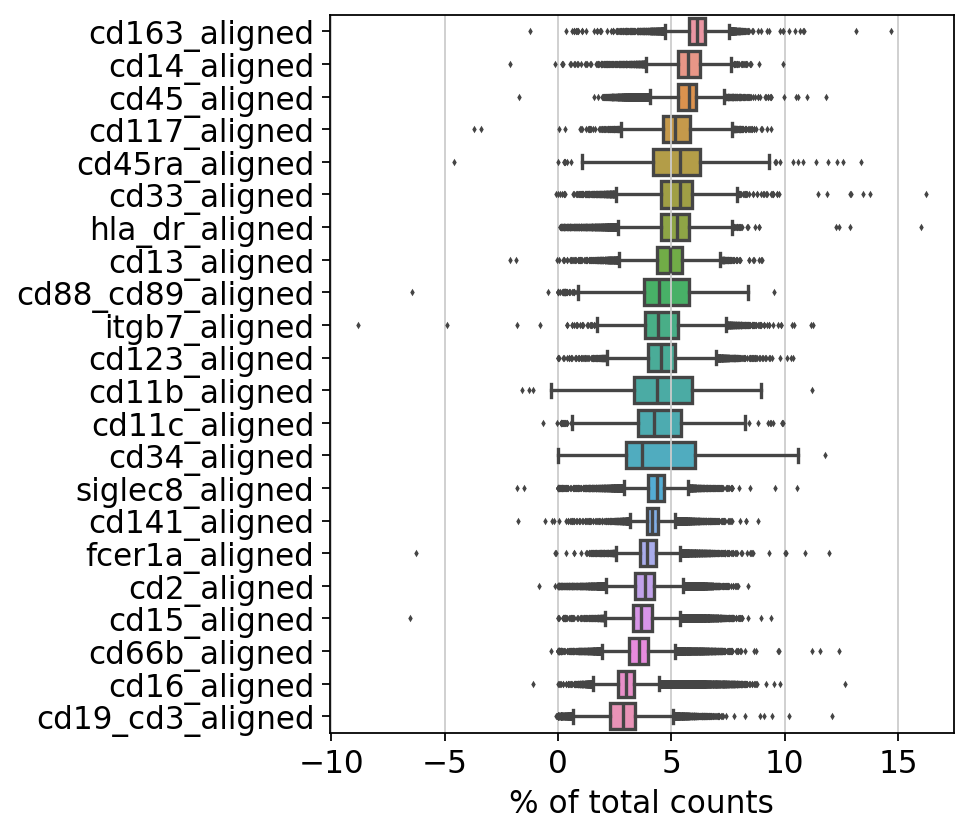

In [6]:
sc.pl.highest_expr_genes(adata_random, n_top=22, )

normalizing counts per cell
    finished (0:00:00)


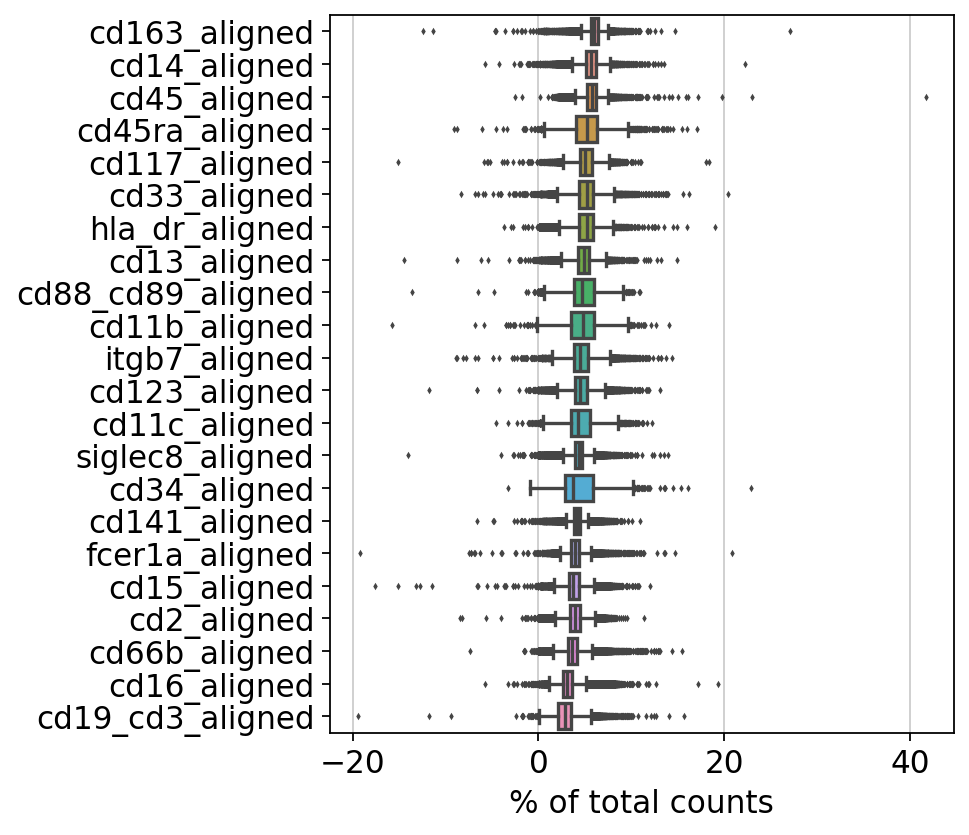

In [7]:
sc.pl.highest_expr_genes(adata_fsbs, n_top=22, )

## pca

In [8]:
sc.tl.pca(adata_ref, svd_solver='arpack')

computing PCA
    with n_comps=21
    finished (0:00:04)


In [9]:
sc.tl.pca(adata_random, svd_solver='arpack')

computing PCA
    with n_comps=21
    finished (0:00:00)


In [10]:
sc.tl.pca(adata_fsbs, svd_solver='arpack')

computing PCA
    with n_comps=21
    finished (0:00:00)


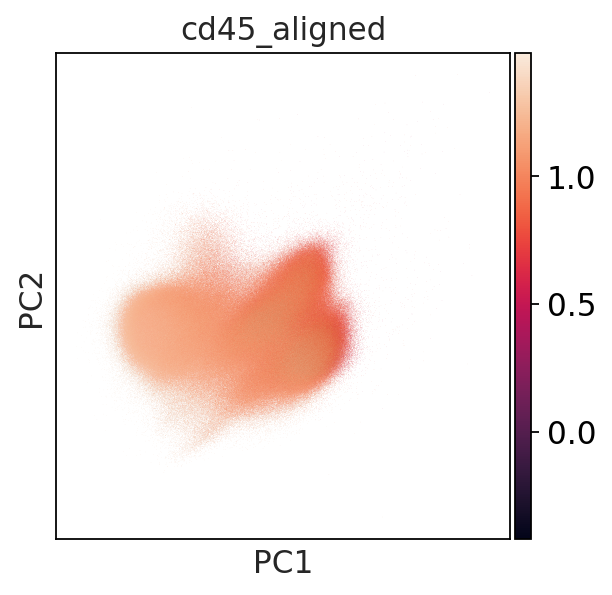

In [27]:
sc.pl.pca(adata_ref, color='cd45_aligned')

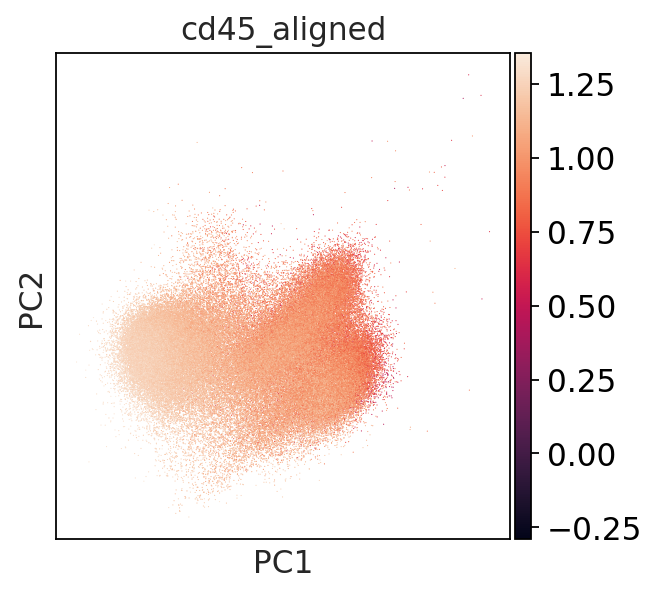

In [25]:
sc.pl.pca(adata_random, color='cd45_aligned')

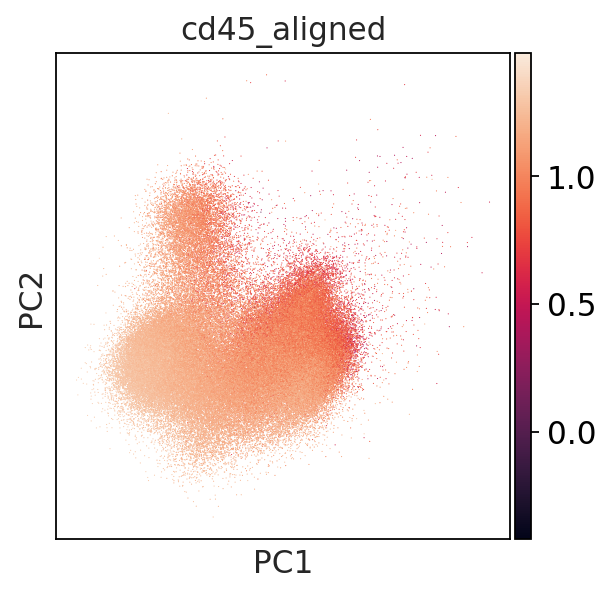

In [26]:
sc.pl.pca(adata_fsbs, color='cd45_aligned')

# Maybe based on the first pcs, we can show that we have a better diversity

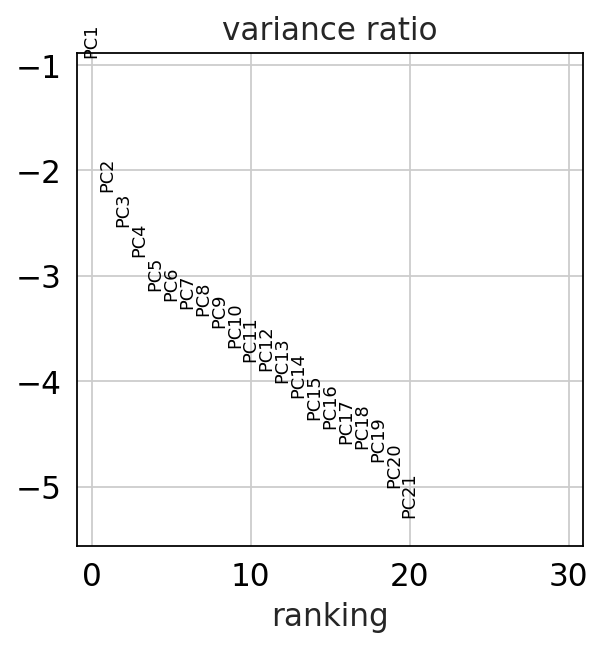

In [28]:
sc.pl.pca_variance_ratio(adata_ref, log=True)

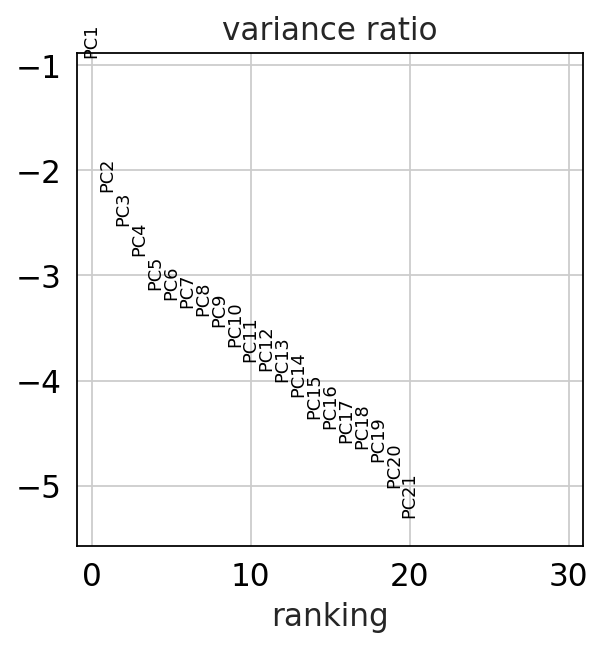

In [29]:
sc.pl.pca_variance_ratio(adata_random, log=True)

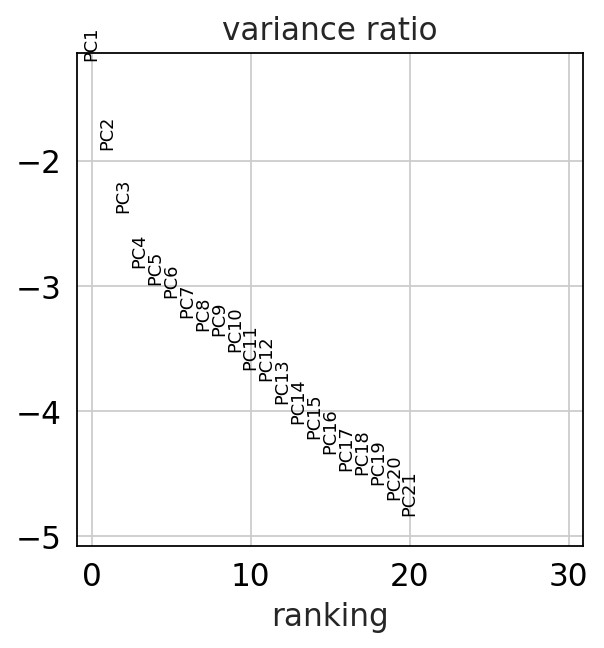

In [30]:
sc.pl.pca_variance_ratio(adata_fsbs, log=True)

In [11]:
sc.pp.neighbors(adata_ref, n_neighbors=10)

computing neighbors
    using data matrix X directly



KeyboardInterrupt



In [12]:
sc.pp.neighbors(adata_random, n_neighbors=10)

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:21)


In [13]:
sc.pp.neighbors(adata_fsbs, n_neighbors=10)

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:10)


In [14]:
sc.tl.leiden(adata_random)

running Leiden clustering
    finished: found 18 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:47)


In [15]:
print

<function print>

In [40]:
sc.tl.paga(adata_random)
sc.pl.paga(adata_random, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
sc.tl.umap(adata_random, init_pos='paga')

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:06)
--> added 'pos', the PAGA positions (adata.uns['paga'])
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:59)


In [43]:
adata_ref.var_names

Index(['cd33_aligned', 'hla_dr_aligned', 'cd19_cd3_aligned', 'cd11b_aligned',
       'cd66b_aligned', 'cd16_aligned', 'cd163_aligned', 'cd14_aligned',
       'cd2_aligned', 'siglec8_aligned', 'cd13_aligned', 'cd45_aligned',
       'cd141_aligned', 'cd15_aligned', 'cd123_aligned', 'cd11c_aligned',
       'cd117_aligned', 'cd45ra_aligned', 'cd34_aligned', 'itgb7_aligned',
       'cd88_cd89_aligned', 'fcer1a_aligned'],
      dtype='object')

In [44]:
adata_ref.obs['population'].value_counts()

population
hspc_like                            457833
classical_monocytes                  416427
late_promyelocyte_like               332649
(progenitor)_erythroid_like          236437
myelocytes                           103392
activated_classical_monocyte_like     99966
early_promyelocyte_like               65347
intermediate_monocyte_like            59779
cd117+_hscp_like                      55780
pdc_progenitor_like                   48469
neutrophil_like                       28218
granulocyte_progenitor_like           26185
non_classical_monocyte_like           25014
conventional_dendritic_like           23128
pdc_like                              12464
eosinophil_like                        8912
Name: count, dtype: int64

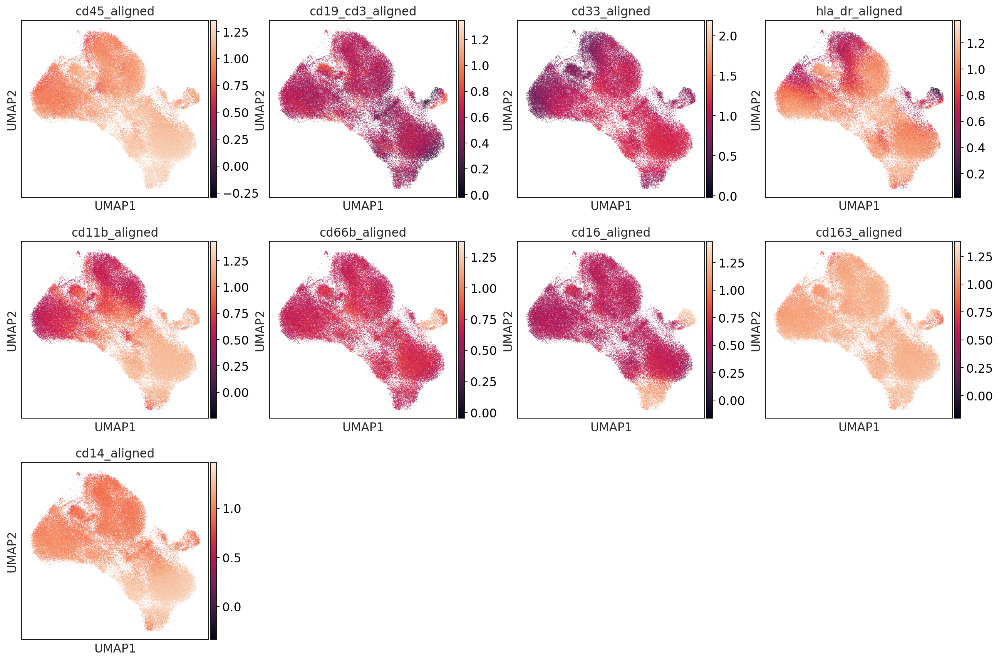

In [49]:
sc.pl.umap(adata_random, color=['cd45_aligned', 'cd19_cd3_aligned', 'cd33_aligned', 'hla_dr_aligned', 'cd11b_aligned', 'cd66b_aligned', 'cd16_aligned', 'cd163_aligned', 'cd14_aligned'])



In [30]:
sc.tl.leiden(adata_fsbs)

running Leiden clustering
    finished: found 30 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:33)


In [42]:
sc.tl.paga(adata_fsbs)
sc.pl.paga(adata_fsbs, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
sc.tl.umap(adata_fsbs, init_pos='paga')

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:09)
--> added 'pos', the PAGA positions (adata.uns['paga'])
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:46)


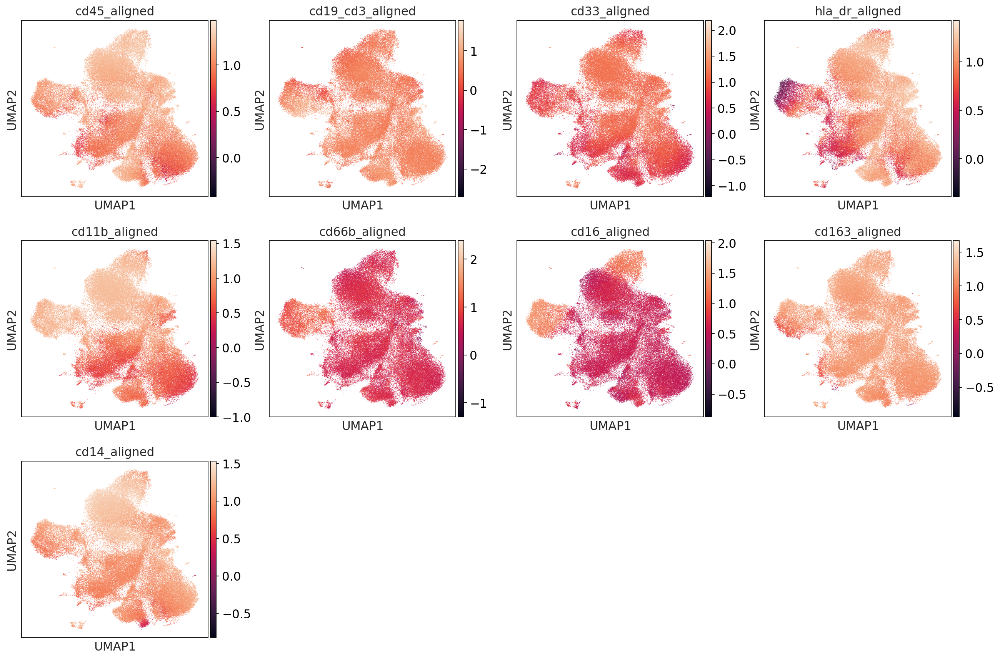

In [50]:
sc.pl.umap(adata_fsbs, color=['cd45_aligned', 'cd19_cd3_aligned', 'cd33_aligned', 'hla_dr_aligned', 'cd11b_aligned', 'cd66b_aligned', 'cd16_aligned', 'cd163_aligned', 'cd14_aligned'])



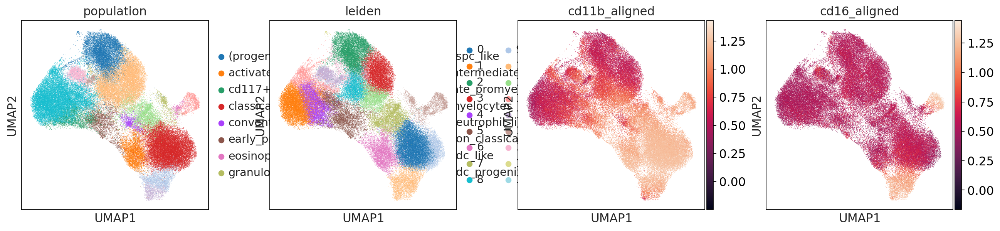

In [54]:
sc.pl.umap(adata_random, color=['population', 'leiden', 'cd11b_aligned', 'cd16_aligned'])



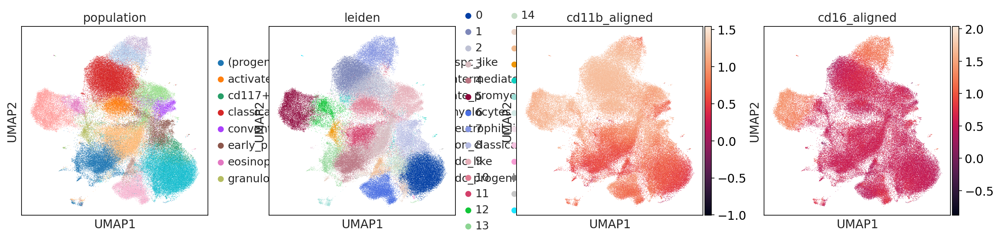

In [53]:
sc.pl.umap(adata_fsbs, color=['population', 'leiden', 'cd11b_aligned', 'cd16_aligned'])


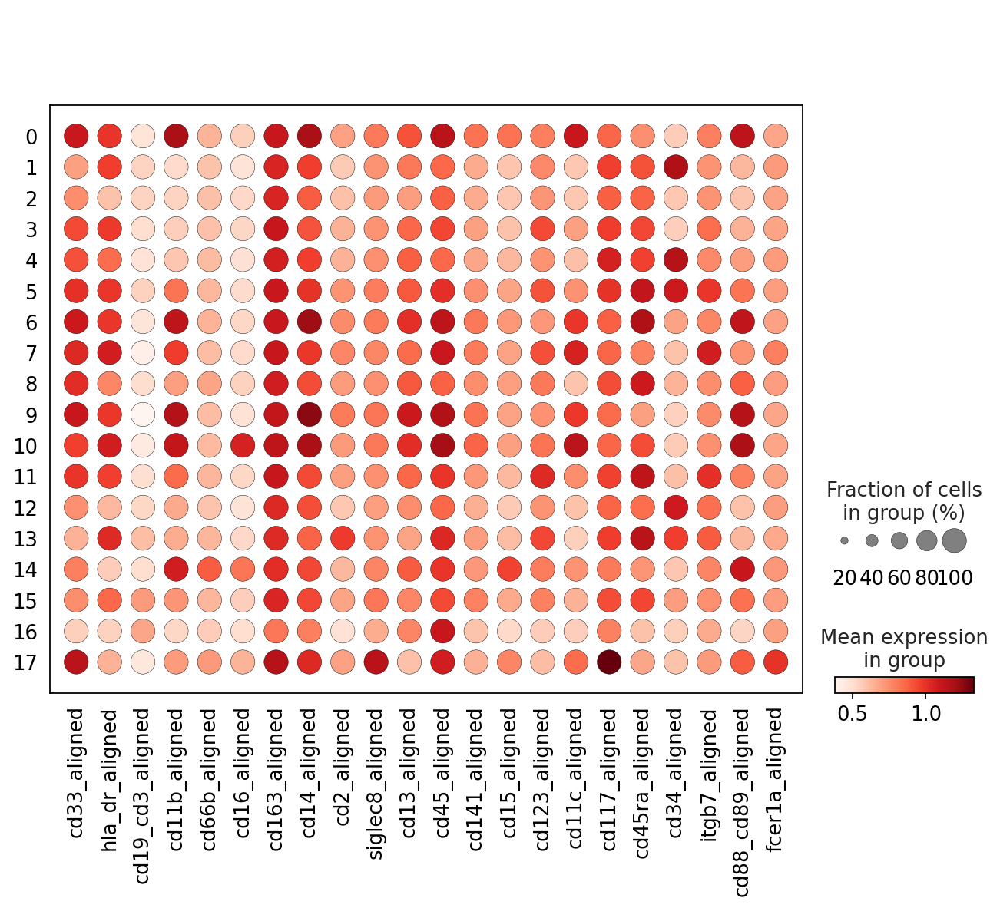

In [55]:
sc.pl.dotplot(adata_random, adata_random.var_names, groupby='leiden');

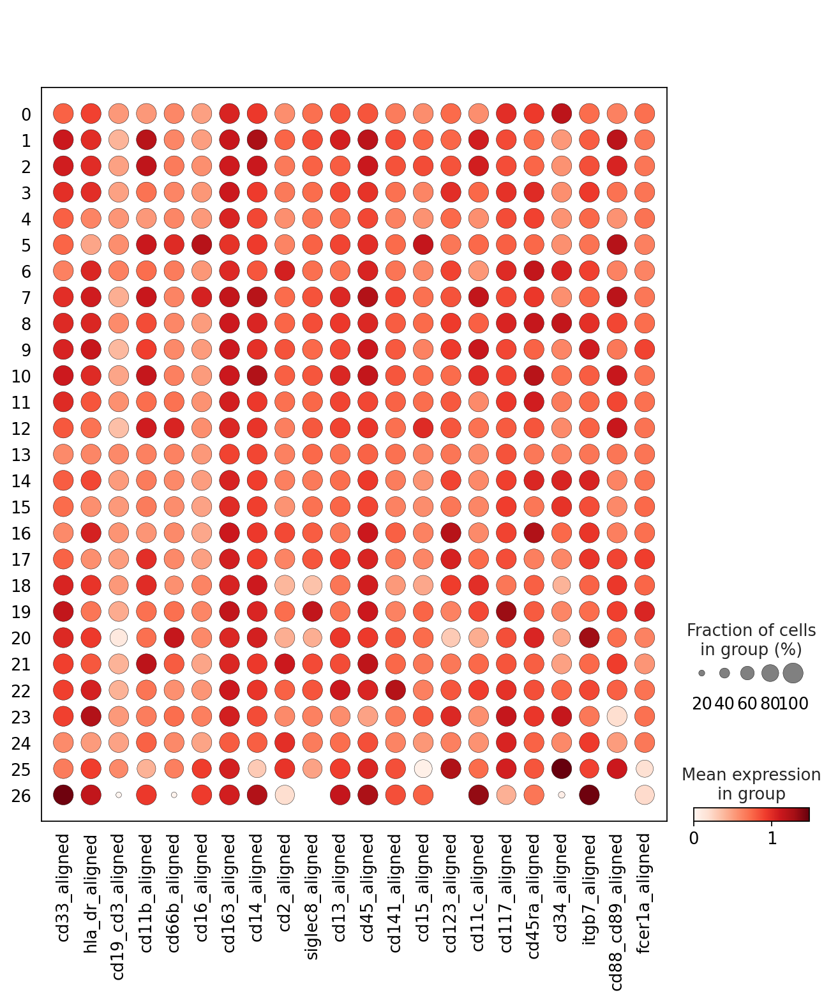

In [56]:
sc.pl.dotplot(adata_fsbs, adata_fsbs.var_names, groupby='leiden');

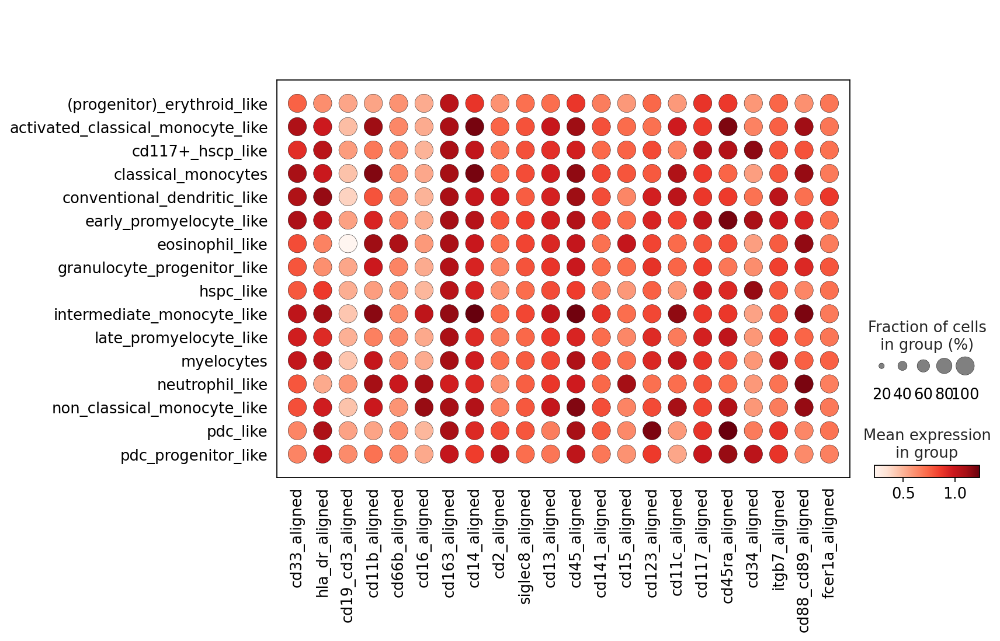

In [57]:
sc.pl.dotplot(adata_random, adata_random.var_names, groupby='population');

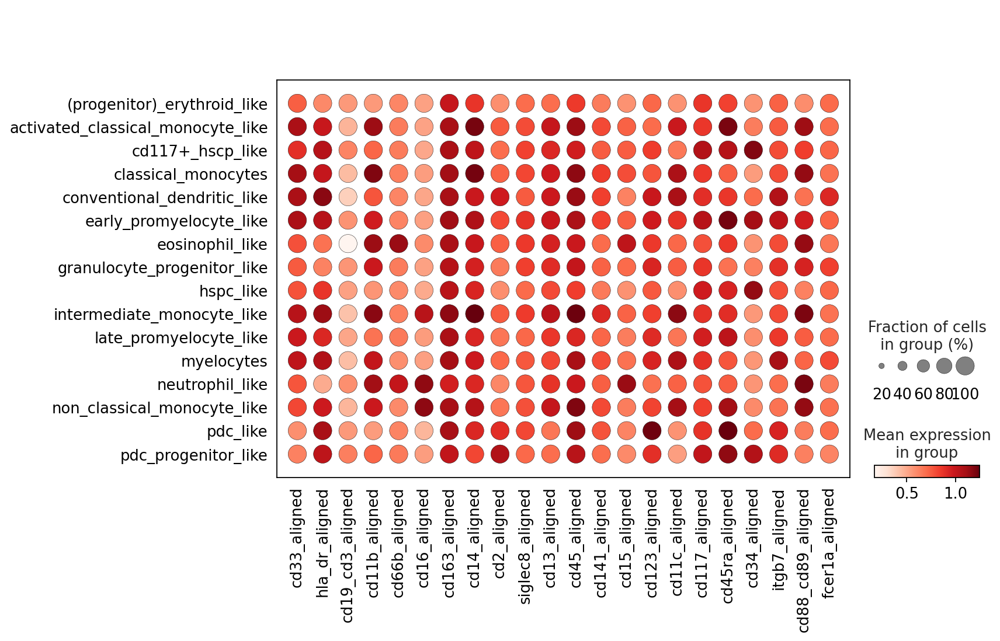

In [58]:
sc.pl.dotplot(adata_fsbs, adata_fsbs.var_names, groupby='population');

In [59]:
adata_ref.obs['population'].value_counts()

population
hspc_like                            457833
classical_monocytes                  416427
late_promyelocyte_like               332649
(progenitor)_erythroid_like          236437
myelocytes                           103392
activated_classical_monocyte_like     99966
early_promyelocyte_like               65347
intermediate_monocyte_like            59779
cd117+_hscp_like                      55780
pdc_progenitor_like                   48469
neutrophil_like                       28218
granulocyte_progenitor_like           26185
non_classical_monocyte_like           25014
conventional_dendritic_like           23128
pdc_like                              12464
eosinophil_like                        8912
Name: count, dtype: int64

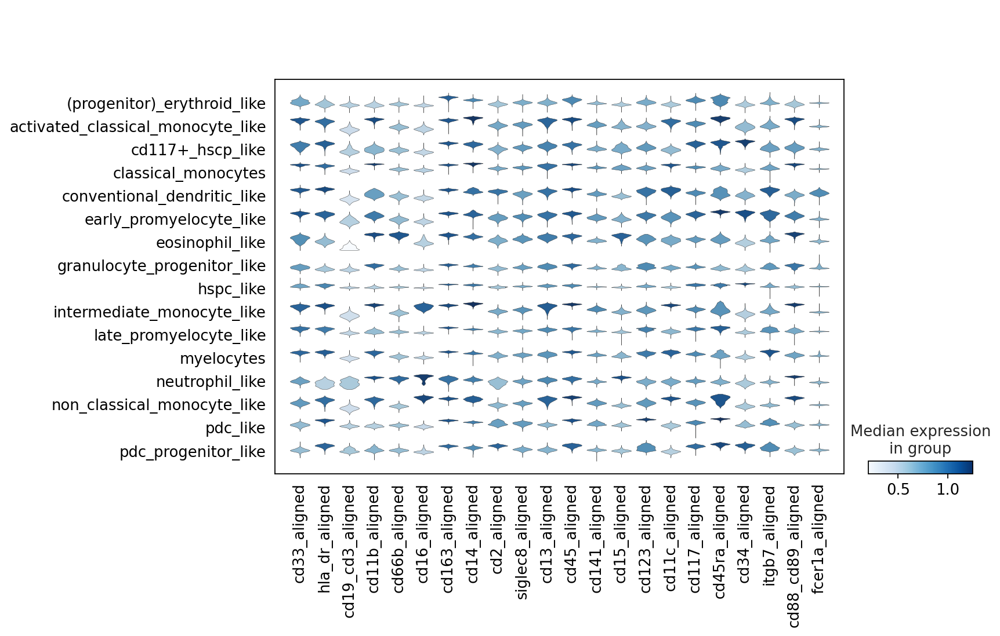

In [60]:
sc.pl.stacked_violin(adata_random, adata_random.var_names, groupby='population', rotation=90);


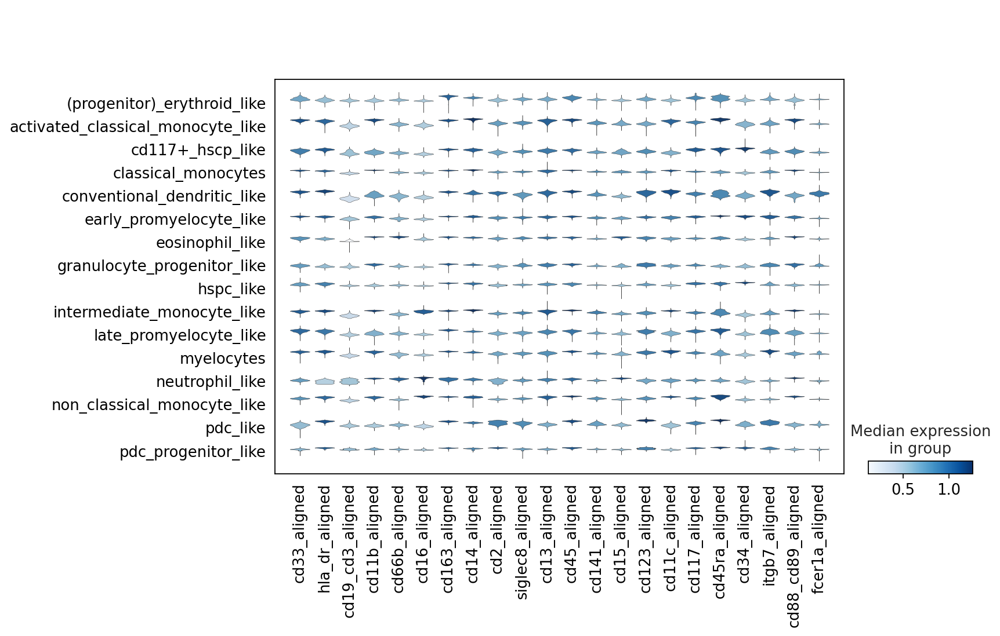

In [61]:
sc.pl.stacked_violin(adata_fsbs, adata_fsbs.var_names, groupby='population', rotation=90);


In [62]:
len(adata_random.var_names)

22

In [64]:
sc.tl.leiden(adata_random, key_added='clusters', resolution=0.5)

running Leiden clustering



KeyboardInterrupt



In [66]:
from matplotlib.pyplot import rc_context


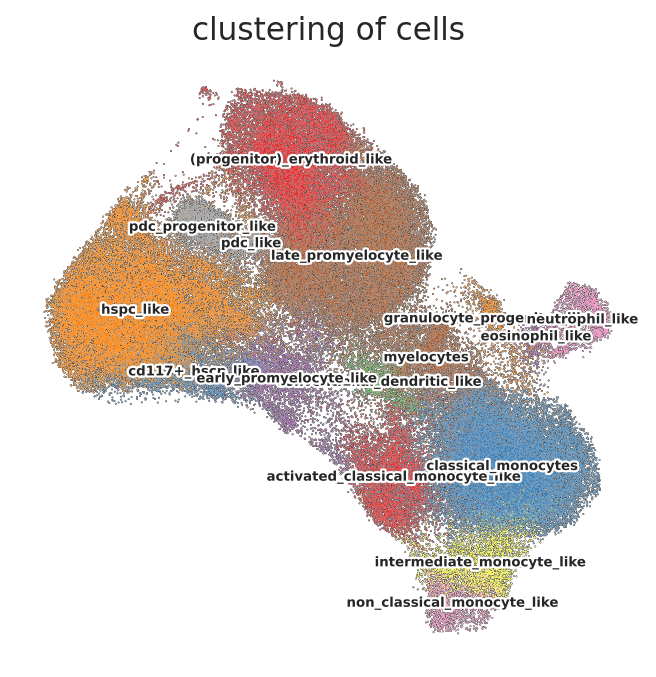

In [70]:
with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.umap(adata_random, color='population', add_outline=True, legend_loc='on data',
               legend_fontsize=6, legend_fontoutline=2,frameon=False,
               title='clustering of cells', palette='Set1')

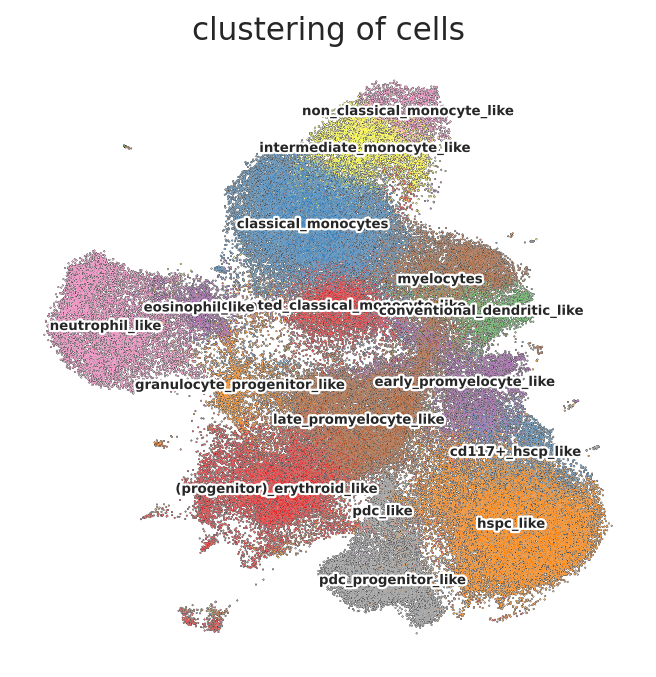

In [71]:
with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.umap(adata_fsbs, color='population', add_outline=True, legend_loc='on data',
               legend_fontsize=6, legend_fontoutline=2,frameon=False,
               title='clustering of cells', palette='Set1')

In [73]:
adata_random.obs.columns

Index(['old_index', 'unique_id', 'sex', 'age', 'subtype', 'type', 'blastcount',
       'survival_sorter', 'run', 'sample_id', 'alignment_mc_aligned',
       'flowsom_cluster', 'flowsom_metacluster', 'population', 'leiden'],
      dtype='object')

In [24]:
from sklearn.metrics import silhouette_score, adjusted_rand_score

In [25]:
adata_random.obs

,old_index,unique_id,sex,age,subtype,type,blastcount,survival_sorter,run,sample_id,alignment_mc_aligned,flowsom_cluster,flowsom_metacluster,population,leiden
1393627,23080838,270_7,m,54,"nk,_npm1_wt;_flt3_itd_(<0,5)",bm,77,"59,6",7,270,10,186,28,late_promyelocyte_like,5
150341,17006485,221_6,f,55,inv(16),pb,44,"66,0",6,221,4,70,8,classical_monocytes,3
1932276,417528,307_1,m,81,"nk,_cebpa",pb,no_punction,"57,3",1,307,10,156,28,late_promyelocyte_like,5
1862139,7391514,183_3,m,61,trisomy_8,bm,100,"65,6",3,183,13,44,2,hspc_like,1
1153571,27060225,224_8,f,70,apl,pb,no_punction,"51,6",8,224,10,160,19,late_promyelocyte_like,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
427450,34015065,229_9,m,48,"complex,_tp53",bm,65,"66,6",9,229,12,155,24,(progenitor)_erythroid_like,2
1539089,26455830,170003_8,f,67,inv(16),bm,33,"62,1",8,170003,13,17,2,hspc_like,1
524277,31511152,20148_9,m,62,del5,bm,67,"53,1",9,20148,10,161,22,pdc_like,12
390404,30309196,20021_9,m,64,"nk,_npm1_wt;_flt3_itd_(<0,5)",pb,90,"69,2",9,20021,10,171,28,late_promyelocyte_like,5


In [18]:
adata_random.obs['flowsom_metacluster'].value_counts()

flowsom_metacluster
2     27912
8     25288
24    14407
28    10131
19     9520
6      5578
9      3374
10     3308
30     3241
3      3146
1      2933
25     1622
12     1566
27     1460
18     1381
23      919
22      783
4       732
14      704
15      655
29      644
20      523
26      482
16      475
17      428
11      311
13      153
Name: count, dtype: int64

In [19]:
adata_random.obs['flowsom_cluster'].value_counts()

flowsom_cluster
72     1419
129    1410
130    1367
59     1307
141    1234
       ... 
94      247
107     247
121     233
78      228
64      153
Name: count, Length: 190, dtype: int64

In [20]:
adata_random.obs['alignment_mc_aligned'].value_counts()

alignment_mc_aligned
13    29801
4     26582
10    22933
12    14754
11     6277
8      6216
15     4355
5      3907
14     2996
7      1692
3      1384
2       673
9        58
6        32
1        16
Name: count, dtype: int64

In [78]:
silhouette_random_leiden = silhouette_score(adata_random.X, adata_random.obs['leiden'])
rand_index_random_leiden = adjusted_rand_score(adata_random.obs['population'], adata_random.obs['leiden'])


print("Silhouette Score *internal* random:", silhouette_random_leiden)
print("Adjusted Rand Index *external pop-leiden*:", rand_index_random_leiden)


Silhouette Score: 0.07081326212225938
Adjusted Rand Index: 0.5196199514851516


In [33]:
# silhouette_fsbs_leiden = silhouette_score(adata_fsbs.X, adata_fsbs.obs['leiden'])
rand_index_fsbs_leiden = adjusted_rand_score(adata_fsbs.obs['population'], adata_fsbs.obs['leiden'])

# print("Silhouette Score:", silhouette_fsbs_leiden)
print("Adjusted Rand Index:", rand_index_fsbs_leiden)

Adjusted Rand Index: 0.5847024968583627


In [26]:
rand_index_random_meta_flow = adjusted_rand_score(adata_random.obs['population'], adata_random.obs['flowsom_metacluster'])
rand_index_random_flow = adjusted_rand_score(adata_random.obs['population'], adata_random.obs['flowsom_cluster'])

print("Adjusted Rand Index *external pop-flow_meta*:", rand_index_random_meta_flow)
print("Adjusted Rand Index *external pop-flow*:", rand_index_random_flow)

Adjusted Rand Index *external pop-flow_meta*: 0.9266325762325822
Adjusted Rand Index *external pop-flow*: 0.0688562244014977


In [35]:
len(adata_fsbs.obs['leiden'].value_counts())

30

In [36]:
len(adata_random.obs['leiden'].value_counts())

18

In [37]:
sc.tl.leiden(adata_fsbs, key_added='leiden_0.5', resolution=0.5)

running Leiden clustering
    finished: found 17 clusters and added
    'leiden_0.5', the cluster labels (adata.obs, categorical) (0:00:34)


In [38]:
len(adata_fsbs.obs['leiden_0.5'].value_counts())

17

In [40]:
rand_index_fsbs_leiden_0_5 = adjusted_rand_score(adata_fsbs.obs['population'], adata_fsbs.obs['leiden_0.5'])

print("Adjusted Rand Index:", rand_index_fsbs_leiden_0_5)

Adjusted Rand Index: 0.7360955056539648
